In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import seaborn as sns

pd.set_option('display.max_colwidth', None)

In [2]:
mdir = r'C:\Users\as836\Documents\SignalScienceLab\SciAdv_NMR_Shift_vf\Data'
adir = r'C:\Users\as836\Documents\SignalScienceLab\SciAdv_NMR_Shift_vf\Analysis'

## Glutathione Analysis

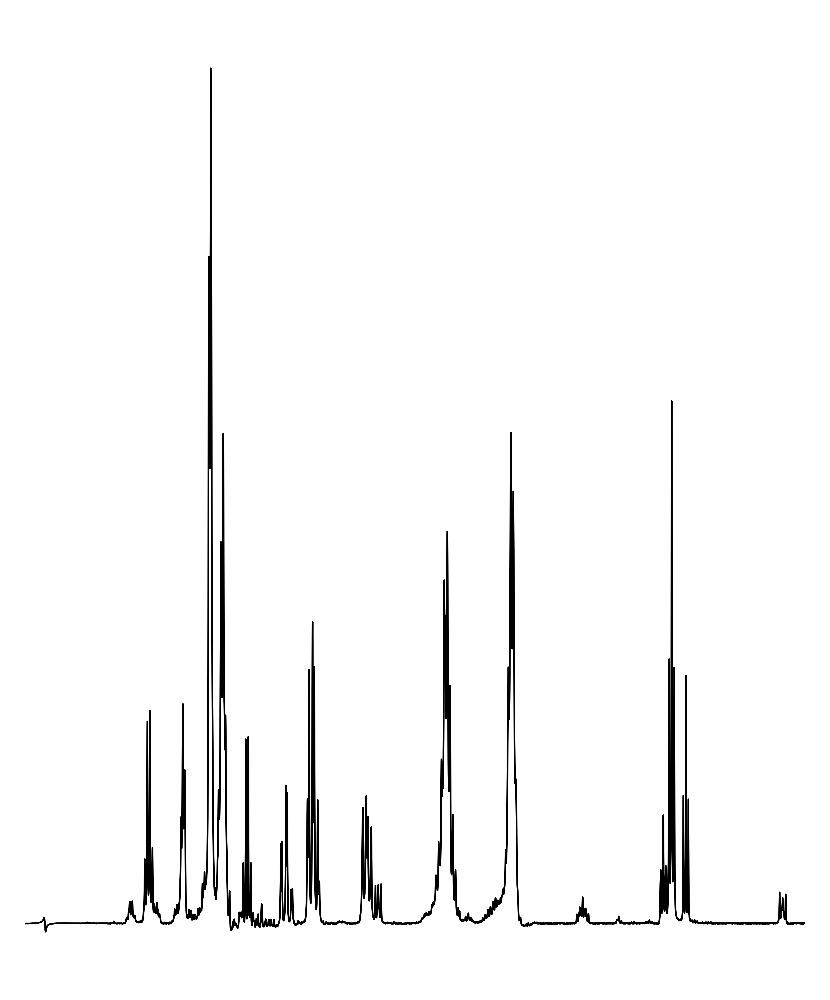

In [86]:
odat = pd.read_csv(os.path.join(mdir, 'glutathione_conv.txt'), sep = ',')
odat = odat[((odat.ppm > 0.5) & (odat.ppm <= 5))]

fig = plt.figure(figsize = (4,5), dpi = 1200)

plt.plot(odat.ppm, odat.intensity, color = 'black', linewidth = 0.5)
plt.yticks([])
plt.xticks([])
plt.xlim([4.9, 0.5])
plt.axis('off')
plt.show()

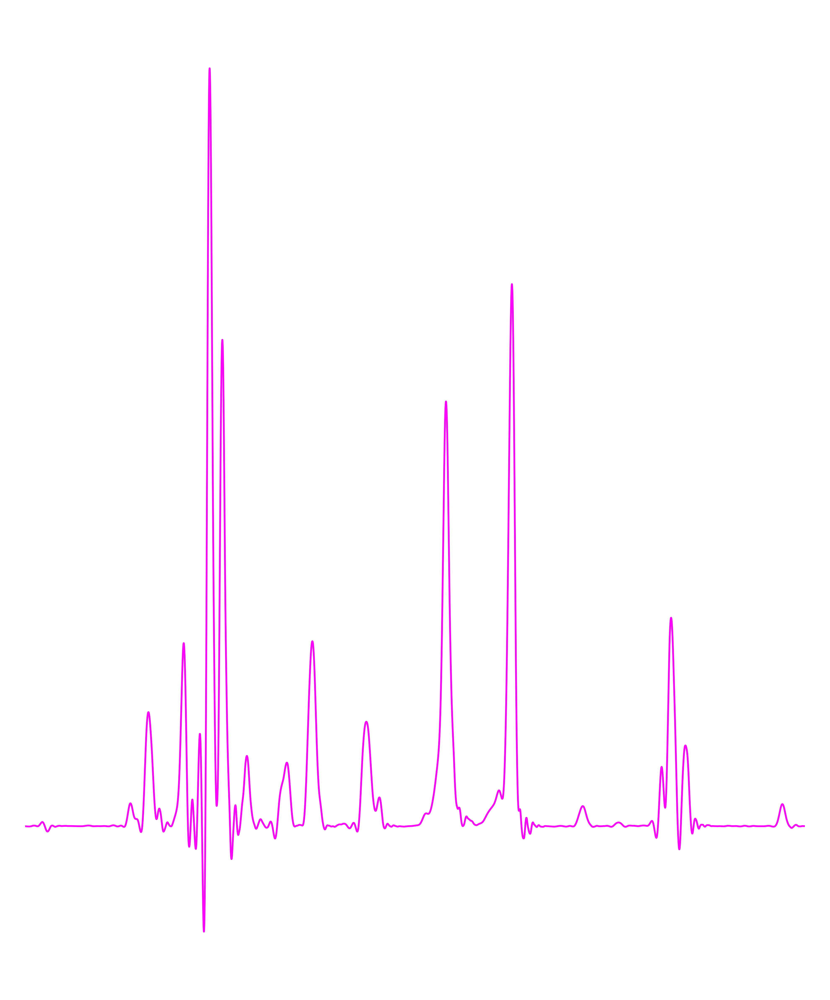

In [87]:
mdat = pd.read_csv(os.path.join(adir, 'gluta_wpt_db9L7.txt'), sep = ',')
mdat.columns = ['ppm', 'intensity']

fig = plt.figure(figsize = (4,5), dpi = 1200)

plt.plot(mdat.ppm, mdat.intensity, color = 'magenta', linewidth = 0.5)
plt.yticks([])
plt.xticks([])
plt.xlim([4.9, 0.5])
plt.axis('off')
plt.show()

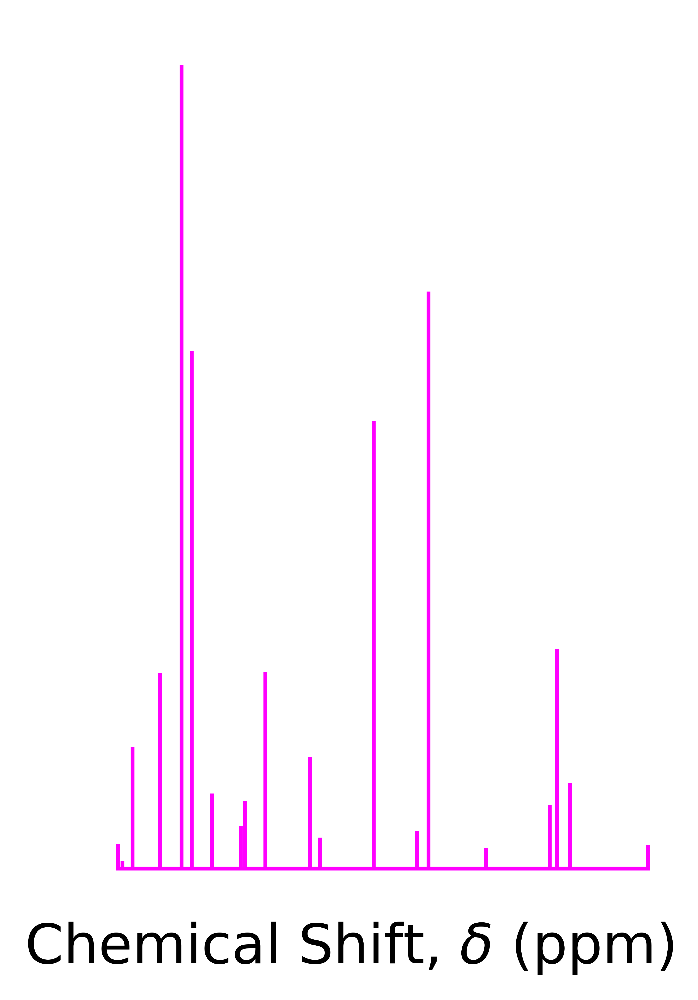

In [88]:
## decomposition level = 7
ndat = pd.DataFrame({'ppm': [0.63, 1.17, 1.26, 1.31, 1.75, 2.15, 2.23, 2.53,
                            2.90, 2.97, 3.28, 3.42, 3.45, 3.65, 3.79, 3.86, 4.01, 4.20, 4.27, 4.30],
                    'intensity': [0.018, 0.066, 0.170, 0.049, 0.016, 0.446, 0.029, 0.346,
                                 0.024, 0.086, 0.152, 0.052, 0.033, 0.058, 0.400, 0.621, 0.151, 0.094, 0.006, 0.019]})

fig = plt.figure(figsize = (4,5), dpi = 1200)

fig.text(0.5, 0.1, 'Chemical Shift, $\delta$ (ppm)', horizontalalignment = 'center', fontsize = 16)

plt.stem(ndat.ppm, ndat.intensity, markerfmt = ' ', basefmt = 'magenta', linefmt = 'magenta')
plt.yticks([])
plt.xticks([])
plt.xlim([4.9, 0.5])
plt.axis('off')
plt.tight_layout()
plt.show()

In [92]:
_min, _max = 1.11, 1.35

labels = ['Original Spectrum', 'L-1', 'L-2', 'L-3', 'L-4', 'L-5', 
          'L-6', 'L-7', 'L-8']
sns.set_context("notebook", font_scale=4.0, rc={"lines.linewidth": 1.1})

fig, axs = plt.subplots(4,1, sharex = True, sharey = True, figsize = (8, 8), dpi = 1200) # change dpi to 1200
axs[0].plot(odat.ppm, odat.intensity / odat.intensity.max(), color = 'k', linewidth = 1)
axs[0].set_title(labels[0], loc = 'left', fontsize = 20)
axs[0].spines['bottom'].set_color(None)
axs[0].spines['right'].set_visible(False)
axs[0].spines['left'].set_visible(False)
axs[0].spines['top'].set_visible(False)
axs[0].set_yticks([])
axs[0].set_xticks([])
axs[0].tick_params(axis = 'x', which = 'both', bottom = False)
axs[0].set_xlim([_max, _min])

fname = 'gluta_wpt_db9L'
x = 4
for j in range(5,8):
    adat = pd.read_csv(os.path.join(adir, fname + str(j) + '.txt'), sep = ',')
    adat.columns = ['ppm', 'intensity']
    adat = adat.loc[((adat.ppm < _max) & (adat.ppm >= _min))]
    adat.intensity /= adat.intensity.max()
        
    axs[j-x].plot(adat.ppm, adat.intensity / adat.intensity.max(), 'magenta', linewidth = 2)
    axs[j-x].spines['bottom'].set_color(None)
    axs[j-x].set_title(labels[j], loc = 'left', fontsize = 20)
    axs[j-x].tick_params(axis = 'x', which = 'both', bottom = False)
    axs[j-x].set_xlim([_max, _min])
    axs[j-x].set_yticks([])
    axs[j-x].spines['right'].set_visible(False)
    axs[j-x].spines['left'].set_visible(False)
    axs[j-x].spines['top'].set_visible(False)
    
axs[j-x].spines['bottom'].set_linewidth(2)
axs[j-x].spines['bottom'].set_color('darkgrey')
axs[j-x].set_xticks([1.1, 1.2, 1.3, 1.4])
axs[j-x].tick_params(axis = 'x', which = 'both', labelsize = 22)
axs[j-x].set_xlim([_max, _min])

fig.text(0.5, -0.06, r'Chemical Shift, $\delta$ (ppm)', horizontalalignment = 'center', fontsize = 22)
    
plt.tight_layout(pad = 0.02)
plt.show()

In [7]:
## Set image directory
idir = r'C:\Users\as836\Documents\SignalScienceLab\SciAdv_NMR_Shift_vf\Images\analysis'

## Approximation and detail components in glutathione analysis
odat = pd.read_csv(os.path.join(mdir, 'glutathione_conv.txt'), sep = ',')
odat = odat[((odat.ppm > 0.5) & (odat.ppm <= 5))]

fig = plt.figure(figsize = (5,5), dpi = 400)
plt.plot(odat.ppm, odat.intensity, color = 'k')
plt.yticks([])
plt.xticks([])
plt.axis('off')
#plt.savefig(os.path.join(idir,'gluta_nmr.png'))
plt.close(fig)

files = ['gluta_wpt_db9L71.txt','gluta_wpt_db9L72.txt','gluta_wpt_db9L7127.txt',
        'gluta_wpt_db9L7128.txt','gluta_wpt_db9L7253.txt','gluta_wpt_db9L7254.txt']

outname = ['gluta_wpt_db9L71.png','gluta_wpt_db9L72.png','gluta_wpt_db9L7127.png',
        'gluta_wpt_db9L7128.png','gluta_wpt_db9L7253.png','gluta_wpt_db9L7254.png']

sns.set_context("notebook", font_scale=1.0, rc={"lines.linewidth": 1.1})

for i in range(len(files)):
    dat = pd.read_csv(os.path.join(adir,files[i]), sep = ',')
    dat.columns = ['ppm','intensity']
    dat = dat[((dat.ppm > 0.5) & (dat.ppm <= 5))]
    fig = plt.figure(figsize = (5,5), dpi = 400)
    plt.plot(dat.ppm, dat.intensity, color = 'k')
    plt.yticks([])
    plt.xticks([])
    plt.axis('off')
    plt.savefig(os.path.join(idir,outname[i]))
    plt.close(fig)

## Analysis of cellobiose NMR data

In [14]:
## At decomposition level-7
adat = np.array([[3.32, 3.44, 3.50, 3.61, 3.65, 3.75, 3.83, 3.89, 3.95, 4.52, 5.24],
                [0.038, 0.044, 0.059, 0.040, 0.073, 0.035, 0.037, 0.030, 0.047, 0.007, 0.010]])

odat = pd.read_csv(os.path.join(mdir, 'cellobiose_conv.txt'), sep = ',')
odat.loc[odat.ppm < 2.4, 'intensity'] = 0

labels = ['Original Spectrum', 'WPT Shift Spectrum']
sns.set_context("notebook", font_scale=4.0, rc={"lines.linewidth": 1.1})
fig, axs = plt.subplots(2,1, sharex = True, sharey = True, figsize = (10, 4), dpi = 1200) # change dpi to 120 
axs[0].plot(odat.ppm, odat.intensity / odat.intensity.max(), color = 'black', linewidth = 0.5)
axs[0].spines['bottom'].set_color(None)
axs[1].spines['bottom'].set_linewidth(2)
axs[0].set_xticks([])
axs[1].stem(adat[0], adat[1] / adat[1].max(), markerfmt = ' ', basefmt = 'lightgray', linefmt = 'deepskyblue')
axs[1].set_xticks([3.4, 4.2, 5.0])
for i in range(2):
    axs[i].set_title(labels[i], fontsize = 12, loc = 'left')
    axs[0].tick_params(axis = 'x', which = 'both', bottom = False)
    axs[1].tick_params(axis = 'x', which = 'both', labelsize = 16)
    axs[i].set_yticks([])
    axs[i].spines['right'].set_visible(False)
    axs[i].spines['left'].set_visible(False)
    axs[i].spines['top'].set_visible(False)
    axs[i].set_xlim(5.4, 3.05)
    
plt.tight_layout(pad = 0.25)
plt.show()

## Analysis of fructose NMR data

In [19]:
## At decomposition level-7
adat = np.array([[3.57, 3.71, 3.81, 3.90, 4.01, 4.04, 4.12],
                [0.070, 0.110, 0.082, 0.058, 0.096, 0.030, 0.046]])

odat = pd.read_csv(os.path.join(mdir, 'fructose_conv.txt'), sep = ',')

labels = ['Original Spectrum', 'WPT Shift Spectrum']
sns.set_context("notebook", font_scale=4.0, rc={"lines.linewidth": 1.1})
fig, axs = plt.subplots(2,1, sharex = True, sharey = True, figsize = (10, 4), dpi = 1200) # change dpi to 1200
axs[0].plot(odat.ppm, odat.intensity / odat.intensity.max(), color = 'black', linewidth = 0.5)
axs[0].spines['bottom'].set_color(None)
axs[1].spines['bottom'].set_linewidth(2)
axs[0].set_xticks([])
axs[1].stem(adat[0], adat[1] / adat[1].max(), markerfmt = ' ', basefmt = 'lightgray', linefmt = 'violet')
axs[1].set_xticks([3.4, 3.8, 4.2])
for i in range(2):
    axs[i].set_title(labels[i], fontsize = 12, loc = 'left')
    axs[0].tick_params(axis = 'x', which = 'both', bottom = False)
    axs[1].tick_params(axis = 'x', which = 'both', labelsize = 16)
    axs[i].set_yticks([])
    axs[i].spines['right'].set_visible(False)
    axs[i].spines['left'].set_visible(False)
    axs[i].spines['top'].set_visible(False)
    axs[i].set_xlim(4.5, 3.2)
    
plt.tight_layout(pad = 0.25)
plt.show()

## Analysis of sucrose NMR data

In [26]:
## At decomposition level-8
adat = np.array([[3.46, 3.55, 3.67, 3.74, 3.82, 3.87, 4.04, 4.21, 5.40],
                [0.016, 0.018, 0.035, 0.019, 0.078, 0.019, 0.011, 0.010, 0.011]])

odat = pd.read_csv(os.path.join(mdir, 'sucrose_conv.txt'), sep = ',')

labels = ['Original Spectrum', 'WPT Shift Spectrum']
sns.set_context("notebook", font_scale=4.0, rc={"lines.linewidth": 1.1})
fig, axs = plt.subplots(2,1, sharex = True, sharey = True, figsize = (10, 4), dpi = 1200) # change dpi to 1200 
axs[0].plot(odat.ppm, odat.intensity / odat.intensity.max(), color = 'black', linewidth = 0.5)
axs[0].spines['bottom'].set_color(None)
axs[1].spines['bottom'].set_linewidth(2)
axs[0].set_xticks([])
axs[1].stem(adat[0], adat[1] / adat[1].max(), markerfmt = ' ', basefmt = 'lightgray', linefmt = 'navy')
axs[1].set_xticks([5.2, 4.5, 3.8])
for i in range(2):
    axs[i].set_title(labels[i], fontsize = 12, loc = 'left')
    axs[0].tick_params(axis = 'x', which = 'both', bottom = False)
    axs[1].tick_params(axis = 'x', which = 'both', labelsize = 16)
    axs[i].set_yticks([])
    axs[i].spines['right'].set_visible(False)
    axs[i].spines['left'].set_visible(False)
    axs[i].spines['top'].set_visible(False)
    axs[i].set_xlim(5.7, 3.2)
    
plt.tight_layout(pad = 0.25)
plt.show()

## Analysis of an equi-mixture of cellobiose, fructose and sucrose

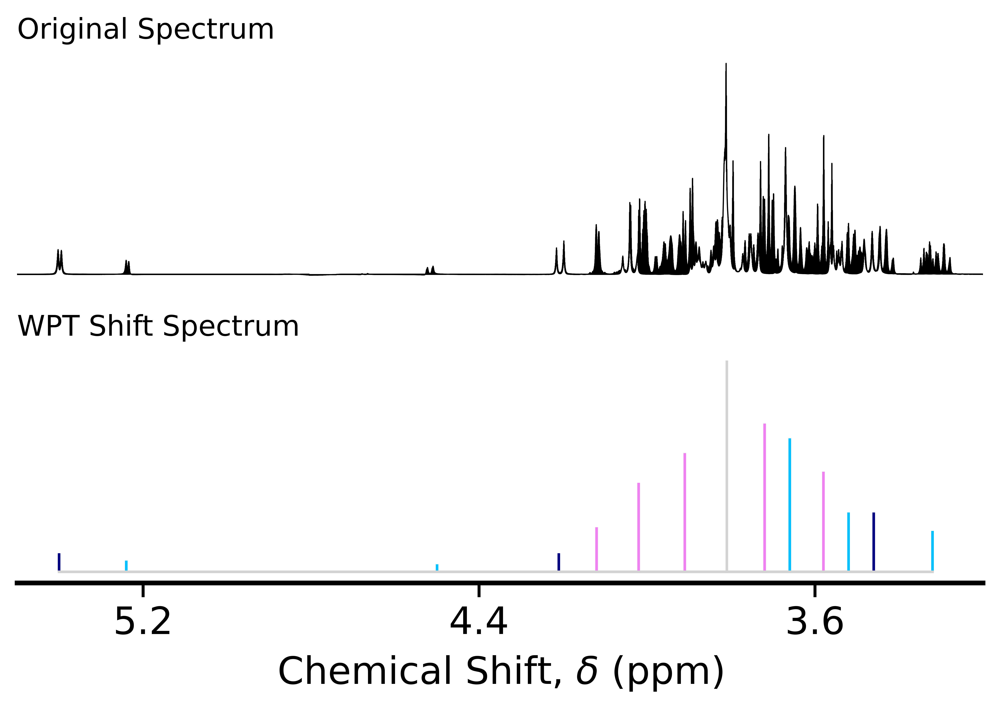

In [27]:
## At decomposition level-8
adat = np.array([[3.32, 3.46, 3.52, 3.58, 3.66, 3.72, 3.81, 3.91, 4.02, 4.12,
                 4.21, 4.50, 5.24, 5.40],
                [0.011, 0.016, 0.016, 0.027, 0.036, 0.040, 0.057, 0.032, 0.024, 0.012,
                0.005, 0.002, 0.003, 0.005]])

## Identify and separate into individual elements for plotting 

adat_cell = np.array([[3.32, 3.52, 3.66, 4.50, 5.24],
                    [0.011, 0.016, 0.036, 0.002, 0.003]])

adat_fruc = np.array([[3.58, 3.72, 3.91, 4.02, 4.12],
                    [0.027, 0.040, 0.032, 0.024, 0.012]])

adat_sucr = np.array([[3.46, 4.21, 5.40],
                    [0.016, 0.005, 0.005]])

dats = [adat_cell, adat_fruc, adat_sucr]

colors = ['deepskyblue', 'violet', 'navy']
#colors = ['deepskyblue', 'royalblue', 'navy']

odat = pd.read_csv(os.path.join(mdir, 'cfs_mix0_vf.txt'), sep = ',')
odat.loc[odat.ppm < 2.4, 'intensity'] = 0


labels = ['Original Spectrum', 'WPT Shift Spectrum']
sns.set_context("notebook", font_scale=4.0, rc={"lines.linewidth": 1.1})
fig, axs = plt.subplots(2,1, sharex = True, sharey = True, figsize = (6, 4), dpi = 1200) # change dpi to 1200
axs[0].plot(odat.ppm, odat.intensity / odat.intensity.max(), color = 'black', linewidth = 0.5)
axs[0].spines['bottom'].set_color(None)
axs[1].spines['bottom'].set_linewidth(2)
axs[0].set_xticks([])
axs[1].stem(adat[0], adat[1] / adat[1].max(), markerfmt = ' ', basefmt = 'white', linefmt = 'lightgray')
for j in range(3):
    axs[1].stem(dats[j][0], dats[j][1] / adat[1].max(), markerfmt = ' ', basefmt = 'lightgray', linefmt = colors[j])
axs[1].set_xticks([3.6, 4.4, 5.2])
for i in range(2):
    axs[i].set_title(labels[i], fontsize = 12, loc = 'left')
    axs[0].tick_params(axis = 'x', which = 'both', bottom = False)
    axs[1].tick_params(axis = 'x', which = 'both', labelsize = 16)
    axs[i].set_yticks([])
    axs[i].spines['right'].set_visible(False)
    axs[i].spines['left'].set_visible(False)
    axs[i].spines['top'].set_visible(False)
    axs[i].set_xlim(5.5, 3.2)


fig.text(0.5, -0.02, r'Chemical Shift, $\delta$ (ppm)', horizontalalignment = 'center', fontsize = 16)
    
plt.tight_layout(pad = 0.25)
plt.show()

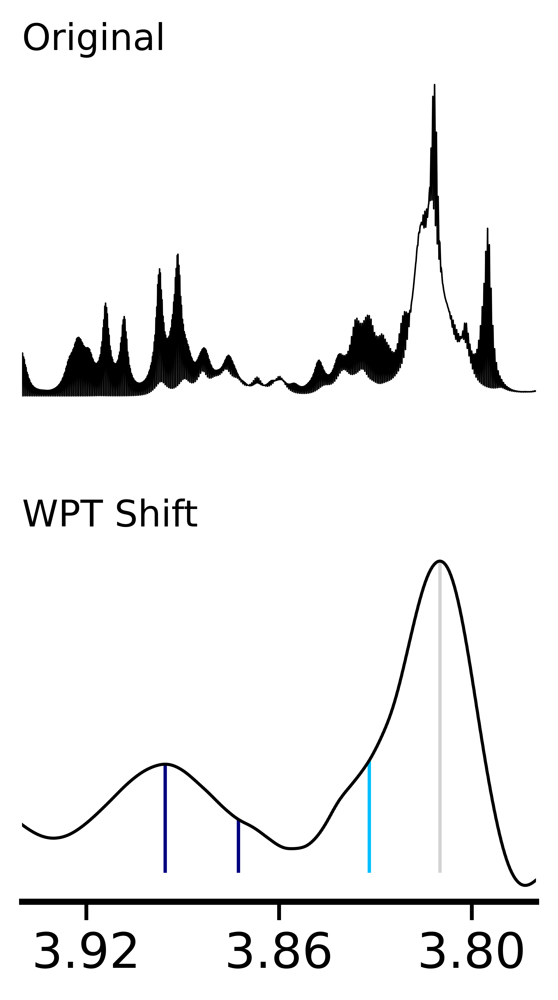

In [30]:
## Analysis of data slice
mdat = pd.read_csv(os.path.join(adir, 'cfs_slice_wpt_db9L7.txt'), sep = ',')
mdat.columns = ['ppm', 'intensity']
mdat.intensity /= mdat.intensity.max()

adat = np.array([[3.80991, 3.83190, 3.87261, 3.89543],
                [0.095, 0.034, 0.016, 0.033]])
#adat = adat[:,-1::-1]

odat = pd.read_csv(os.path.join(mdir, 'cfs_mix0_vf.txt'), sep = ',')
odat = odat[((odat.ppm > 3.78) & (odat.ppm <= 3.94))]

colors = ['lightgray','deepskyblue','navy','navy']

labels = ['Original', 'WPT Shift']
sns.set_context("notebook", font_scale=4.0, rc={"lines.linewidth": 1.1})
fig, axs = plt.subplots(2,1, sharex = True, sharey = True, figsize = (3, 5), dpi = 1200) # change dpi to 1200
axs[0].plot(odat.ppm, odat.intensity / odat.intensity.max(), color = 'black', linewidth = 0.5)
axs[0].spines['bottom'].set_color(None)
axs[1].spines['bottom'].set_linewidth(2)
axs[0].set_xticks([])
for j in range(4):
    markerline, stemlines, baseline = axs[1].stem(adat[0][j], adat[1][j] / adat[1].max(), markerfmt = ' ', 
                                                  basefmt = 'lightgray')
#    plt.setp(stemlines, 'color', 'gray')
    plt.setp(stemlines, 'color', colors[j])
    
axs[1].plot(mdat.ppm, mdat.intensity, color = 'black', linewidth = 1)
axs[1].set_xticks([3.80, 3.86, 3.92])
for i in range(2):
    axs[i].set_title(labels[i], fontsize = 12, loc = 'left')
    axs[0].tick_params(axis = 'x', which = 'both', bottom = False)
    axs[1].tick_params(axis = 'x', which = 'both', labelsize = 16)
    axs[i].set_yticks([])
    axs[i].spines['right'].set_visible(False)
    axs[i].spines['left'].set_visible(False)
    axs[i].spines['top'].set_visible(False)
    axs[i].set_xlim(3.94, 3.78)

'''
for i,j in zip(adat[0], adat[1] / adat[1].max()):
    if j > 0.05:
        axs[1].annotate(str(np.round(i,2)), xy=(i, j + 0.02), fontsize = 14, rotation = 35)
'''
        
plt.tight_layout(pad = 0.5)
plt.show()

## Analysis of noisy NMR spectrum of an equi-mixture of cellobiose, fructose and sucrose

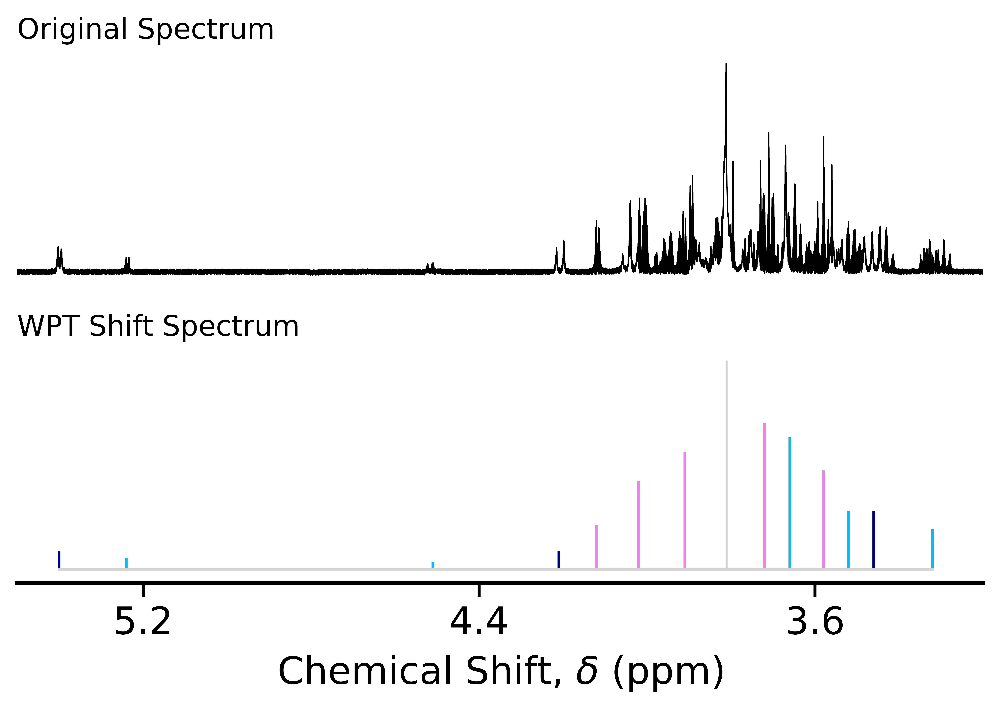

In [32]:
## At decomposition level-8
adat = np.array([[3.32, 3.46, 3.52, 3.58, 3.66, 3.72, 3.81, 3.91, 4.02, 4.12,
                 4.21, 4.51, 5.24, 5.40],
                [0.011, 0.016, 0.016, 0.027, 0.036, 0.040, 0.057, 0.032, 0.024, 0.012,
                0.005, 0.002, 0.003, 0.005]])

## Identify and separate into individual elements for plotting 

adat_cell = np.array([[3.32, 3.52, 3.66, 4.51, 5.24],
                    [0.011, 0.016, 0.036, 0.002, 0.003]])

adat_fruc = np.array([[3.58, 3.72, 3.91, 4.02, 4.12],
                    [0.027, 0.040, 0.032, 0.024, 0.012]])

adat_sucr = np.array([[3.46, 4.21, 5.40],
                    [0.016, 0.005, 0.005]])

dats = [adat_cell, adat_fruc, adat_sucr]

colors = ['deepskyblue', 'violet', 'navy']

odat = pd.read_csv(os.path.join(mdir, 'cfs_mix0_noisy_vf.txt'), sep = ',')
odat.loc[odat.ppm < 2.4, 'intensity'] = 0


labels = ['Original Spectrum', 'WPT Shift Spectrum']
sns.set_context("notebook", font_scale=4.0, rc={"lines.linewidth": 1.1})
fig, axs = plt.subplots(2,1, sharex = True, sharey = True, figsize = (6, 4), dpi = 1200) # change dpi to 1200
axs[0].plot(odat.ppm, odat.intensity / odat.intensity.max(), color = 'black', linewidth = 0.5)
axs[0].spines['bottom'].set_color(None)
axs[1].spines['bottom'].set_linewidth(2)
axs[0].set_xticks([])
axs[1].stem(adat[0], adat[1] / adat[1].max(), markerfmt = ' ', basefmt = 'white', linefmt = 'lightgray')
for j in range(3):
    axs[1].stem(dats[j][0], dats[j][1] / adat[1].max(), markerfmt = ' ', basefmt = 'lightgray', linefmt = colors[j])
axs[1].set_xticks([3.6, 4.4, 5.2])
for i in range(2):
    axs[i].set_title(labels[i], fontsize = 12, loc = 'left')
    axs[0].tick_params(axis = 'x', which = 'both', bottom = False)
    axs[1].tick_params(axis = 'x', which = 'both', labelsize = 16)
    axs[i].set_yticks([])
    axs[i].spines['right'].set_visible(False)
    axs[i].spines['left'].set_visible(False)
    axs[i].spines['top'].set_visible(False)
    axs[i].set_xlim(5.5, 3.2)


fig.text(0.5, -0.02, r'Chemical Shift, $\delta$ (ppm)', horizontalalignment = 'center', fontsize = 16)
    
plt.tight_layout(pad = 0.25)
plt.show()

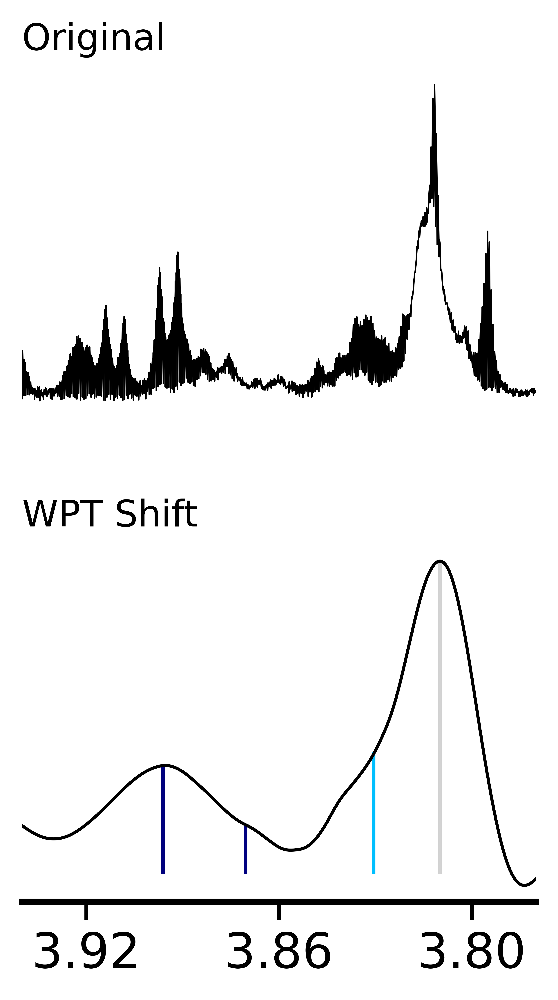

In [33]:
## Analysis of data slice
mdat = pd.read_csv(os.path.join(adir, 'cfs_noisy_slice_wpt_db9L7.txt'), sep = ',')
mdat.columns = ['ppm', 'intensity']
mdat.intensity /= mdat.intensity.max()

adat = np.array([[3.80991, 3.83052, 3.87041, 3.89609],
                [0.095, 0.037, 0.015, 0.033]])
#adat = adat[:,-1::-1]

odat = pd.read_csv(os.path.join(mdir, 'cfs_mix0_noisy_vf.txt'), sep = ',')
odat = odat[((odat.ppm > 3.78) & (odat.ppm <= 3.94))]

colors = ['lightgray','deepskyblue','navy','navy']

labels = ['Original', 'WPT Shift']
sns.set_context("notebook", font_scale=4.0, rc={"lines.linewidth": 1.1})
fig, axs = plt.subplots(2,1, sharex = True, sharey = True, figsize = (3, 5), dpi = 1200) # change dpi to 1200
axs[0].plot(odat.ppm, odat.intensity / odat.intensity.max(), color = 'black', linewidth = 0.5)
axs[0].spines['bottom'].set_color(None)
axs[1].spines['bottom'].set_linewidth(2)
axs[0].set_xticks([])
for j in range(4):
    markerline, stemlines, baseline = axs[1].stem(adat[0][j], adat[1][j] / adat[1].max(), markerfmt = ' ', 
                                                  basefmt = 'lightgray')
#    plt.setp(stemlines, 'color', 'gray')
    plt.setp(stemlines, 'color', colors[j])
    
axs[1].plot(mdat.ppm, mdat.intensity, color = 'black', linewidth = 1)
axs[1].set_xticks([3.80, 3.86, 3.92])
for i in range(2):
    axs[i].set_title(labels[i], fontsize = 12, loc = 'left')
    axs[0].tick_params(axis = 'x', which = 'both', bottom = False)
    axs[1].tick_params(axis = 'x', which = 'both', labelsize = 16)
    axs[i].set_yticks([])
    axs[i].spines['right'].set_visible(False)
    axs[i].spines['left'].set_visible(False)
    axs[i].spines['top'].set_visible(False)
    axs[i].set_xlim(3.94, 3.78)

'''
for i,j in zip(adat[0], adat[1] / adat[1].max()):
    if j > 0.05:
        axs[1].annotate(str(np.round(i,2)), xy=(i, j + 0.02), fontsize = 14, rotation = 35)
'''
        
plt.tight_layout(pad = 0.5)
plt.show()

## Analysis of individual amino acid NMR spectra

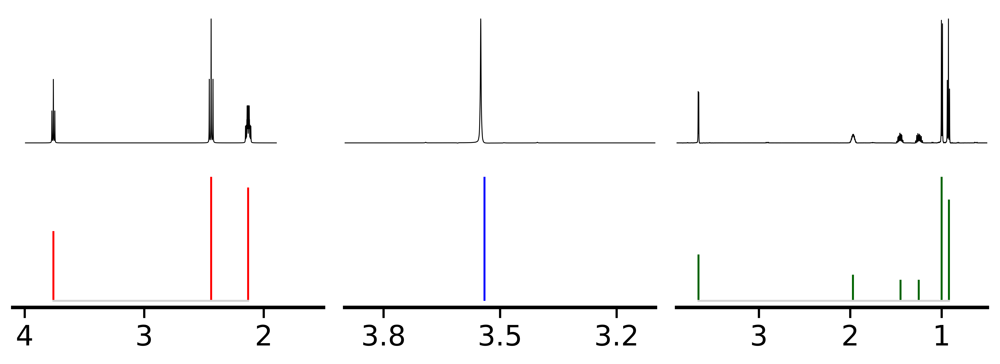

In [5]:
ofiles = ['glutamine_conv.txt','glycine_conv.txt','isoleucine_conv.txt',
          'leucine_conv.txt','threonine_conv.txt','valine_conv.txt']

## At decomposition level = 7
adats = [[[2.13, 2.44, 3.76],[0.190, 0.208, 0.117]], 
         [[3.54],[0.119]],
         [[0.92, 1.00, 1.25, 1.45, 1.97, 3.66],[0.236, 0.289, 0.049, 0.049, 0.061, 0.108]],
         [[0.95, 1.70, 3.73],[0.461, 0.096, 0.060]], 
         [[1.32, 3.58, 4.24],[0.291, 0.123, 0.026]],
         [[0.97, 1.03, 2.26, 3.60],[0.282, 0.226, 0.061, 0.105]]]

lims = [[4.1, 1.5], [3.9, 3.1], [3.9, 0.5], [3.9, 0.5], [4.4, 1.05], [3.9, 0.5]]

ticks = [[2,3,4], [3.2, 3.5, 3.8], [1,2,3], [1,2,3], [2,3,4], [1,2,3]]

colors = ['red', 'blue', 'darkgreen', 'magenta', 'lime', 'orange']

sns.set_context("notebook", font_scale=4.0, rc={"lines.linewidth": 1.1})
fig, axs = plt.subplots(2,3, sharex = False, sharey = True, figsize = (8, 3), dpi = 1200) # change dpi to 1200
for i in range(3):

    odat = pd.read_csv(os.path.join(mdir, ofiles[i]), sep = ',')
    axs[0,i].plot(odat.ppm, odat.intensity / odat.intensity.max(), color = 'black', linewidth = 0.5)
    axs[0,i].spines['bottom'].set_color(None)
    axs[1,i].spines['bottom'].set_linewidth(2)
    axs[0,i].set_xticks([])
    axs[1,i].stem(adats[i][0], np.array(adats[i][1]) / max(adats[i][1]), 
                  markerfmt = ' ', basefmt = 'lightgray', linefmt = colors[i])
    axs[0,i].tick_params(axis = 'x', which = 'both', bottom = False)
    axs[1,i].tick_params(axis = 'x', which = 'both', labelsize = 16)
    axs[1,i].set_xticks(ticks[i])
    for j in range(2):
        axs[j,i].set_yticks([])
        axs[j,i].spines['right'].set_visible(False)
        axs[j,i].spines['left'].set_visible(False)
        axs[j,i].spines['top'].set_visible(False)
        axs[j,i].set_xlim(lims[i])


plt.tight_layout(pad = 0.25)
plt.show()

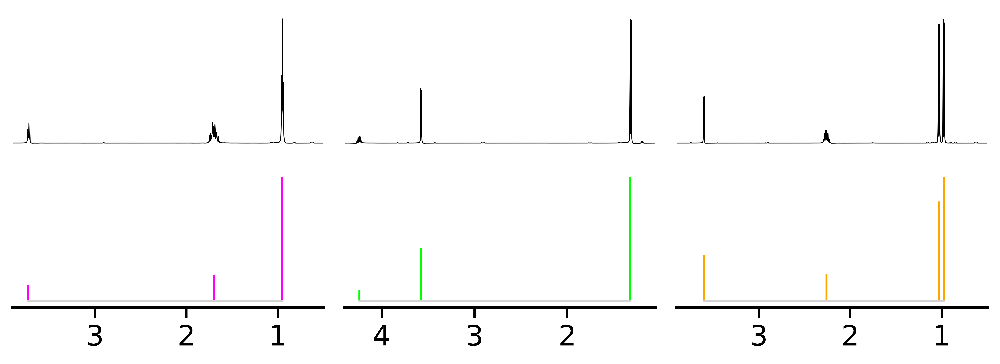

In [6]:
sns.set_context("notebook", font_scale=4.0, rc={"lines.linewidth": 1.1})
fig, axs = plt.subplots(2,3, sharex = False, sharey = True, figsize = (8, 3), dpi = 1200) # change dpi to 1200
for i in range(3, 6):

    odat = pd.read_csv(os.path.join(mdir, ofiles[i]), sep = ',')
    axs[0,i-3].plot(odat.ppm, odat.intensity / odat.intensity.max(), color = 'black', linewidth = 0.5)
    axs[0,i-3].spines['bottom'].set_color(None)
    axs[1,i-3].spines['bottom'].set_linewidth(2)
    axs[0,i-3].set_xticks([])
    axs[1,i-3].stem(adats[i][0], np.array(adats[i][1]) / max(adats[i][1]), 
                  markerfmt = ' ', basefmt = 'lightgray', linefmt = colors[i])
    axs[0,i-3].tick_params(axis = 'x', which = 'both', bottom = False)
    axs[1,i-3].tick_params(axis = 'x', which = 'both', labelsize = 16)
    axs[1,i-3].set_xticks(ticks[i])
    for j in range(2):
        axs[j,i-3].set_yticks([])
        axs[j,i-3].spines['right'].set_visible(False)
        axs[j,i-3].spines['left'].set_visible(False)
        axs[j,i-3].spines['top'].set_visible(False)
        axs[j,i-3].set_xlim(lims[i])


plt.tight_layout(pad = 0.25)
plt.show()

## Analysis of metabolomic mixture

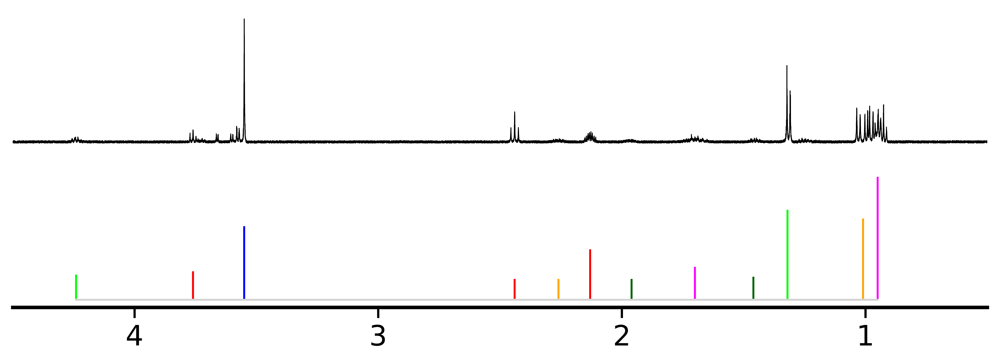

In [7]:
## Analysis of mix-1 at decomposition level-7
adat = np.array([[0.95, 1.01, 1.32, 1.46, 1.70, 1.96, 2.13, 2.26, 2.44,
                 3.55, 3.76, 4.24],
                [0.112, 0.074, 0.082, 0.021, 0.030, 0.019, 0.046, 0.019, 0.047,
                0.105, 0.026, 0.023]])

## Identify and separate individual components by peak positions
adat_glu = np.array([[2.13, 2.44, 3.76],
                    [0.046, 0.019, 0.026]])

adat_gly = np.array([[3.55],
                    [0.067]])

adat_ile = np.array([[1.46, 1.96],
                    [0.021, 0.019]])

adat_leu = np.array([[0.95, 1.70],
                    [0.112, 0.030]])

adat_thr = np.array([[1.32, 4.24],
                    [0.082, 0.023]])

adat_val = np.array([[1.01, 2.26],
                    [0.074, 0.019]])

#adat_unk = np.array([[3.56],
#                    [0.067]])

dats = [adat_glu, adat_gly, adat_ile, adat_leu, adat_thr, adat_val]

colors = ['red', 'blue', 'darkgreen', 'magenta', 'lime', 'orange']

odat = pd.read_csv(os.path.join(mdir, 'metabol_mix_noisy_vf.txt'), sep = ',')

labels = ['Original Spectrum', 'WPT Shift Spectrum']
sns.set_context("notebook", font_scale=4.0, rc={"lines.linewidth": 1.1})
fig, axs = plt.subplots(2,1, sharex = True, sharey = True, figsize = (8, 3), dpi = 1200) # change dpi to 1200
axs[0].plot(odat.ppm, odat.intensity / odat.intensity.max(), color = 'black', linewidth = 0.5)
axs[0].spines['bottom'].set_color(None)
axs[1].spines['bottom'].set_linewidth(2)
axs[0].set_xticks([])
#axs[1].stem(adat[0], adat[1] / adat[1].max(), markerfmt = ' ', basefmt = 'white', linefmt = 'gray')
for j in range(6):
    axs[1].stem(dats[j][0], dats[j][1] / adat[1].max(), markerfmt = ' ', basefmt = 'lightgray', linefmt = colors[j])
axs[1].set_xticks([5, 4, 3, 2, 1])
for i in range(2):
    axs[0].tick_params(axis = 'x', which = 'both', bottom = False)
    axs[1].tick_params(axis = 'x', which = 'both', labelsize = 16)
    axs[i].set_yticks([])
    axs[i].spines['right'].set_visible(False)
    axs[i].spines['left'].set_visible(False)
    axs[i].spines['top'].set_visible(False)
    axs[i].set_xlim(4.5, 0.5)

#fig.text(0.5, -0.02, r'Chemical Shift, $\delta$ (ppm)', horizontalalignment = 'center', fontsize = 16)
    
plt.tight_layout(pad = 0.25)
plt.show()

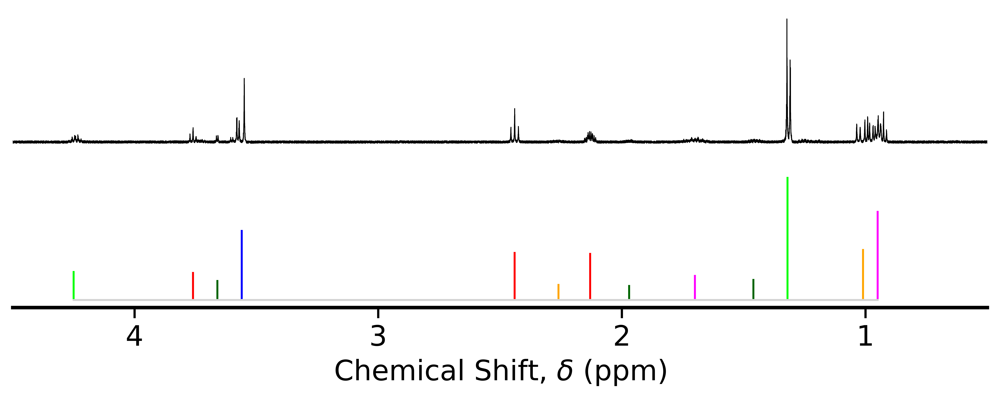

In [9]:
## Analysis of mix-2 at decomposition level-7
adat = np.array([[0.95, 1.01, 1.32, 1.46, 1.70, 1.97, 2.13, 2.26, 2.44,
                 3.56, 3.66, 3.76, 4.25],
                [0.089, 0.051, 0.123, 0.021, 0.025, 0.015, 0.047, 0.016, 0.048,
                0.070, 0.020, 0.028, 0.029]])
## Identify and separate individual components by peak positions
adat_glu = np.array([[2.13, 2.44, 3.76],
                    [0.047, 0.048, 0.028]])

adat_gly = np.array([[3.56],
                    [0.070]])

adat_ile = np.array([[1.46, 1.97, 3.66],
                    [0.021, 0.015, 0.020]])

adat_leu = np.array([[0.95, 1.70],
                    [0.089, 0.025]])

adat_thr = np.array([[1.32, 4.25],
                    [0.123, 0.029]])

adat_val = np.array([[1.01, 2.26],
                    [0.051, 0.016]])

dats = [adat_glu, adat_gly, adat_ile, adat_leu, adat_thr, adat_val]

colors = ['red', 'blue', 'darkgreen', 'magenta', 'lime', 'orange']

odat = pd.read_csv(os.path.join(mdir, 'metabol_mix2_noisy_vf.txt'), sep = ',')

labels = ['Original Spectrum', 'WPT Shift Spectrum']
sns.set_context("notebook", font_scale=4.0, rc={"lines.linewidth": 1.1})
fig, axs = plt.subplots(2,1, sharex = True, sharey = True, figsize = (8, 3), dpi = 1200) # change dpi to 1200
axs[0].plot(odat.ppm, odat.intensity / odat.intensity.max(), color = 'black', linewidth = 0.5)
axs[0].spines['bottom'].set_color(None)
axs[1].spines['bottom'].set_linewidth(2)
axs[0].set_xticks([])
#axs[1].stem(adat[0], adat[1] / adat[1].max(), markerfmt = ' ', basefmt = 'white', linefmt = 'gray')
for j in range(6):
    axs[1].stem(dats[j][0], dats[j][1] / adat[1].max(), markerfmt = ' ', basefmt = 'lightgray', linefmt = colors[j])
axs[1].set_xticks([5, 4, 3, 2, 1])
for i in range(2):
    axs[0].tick_params(axis = 'x', which = 'both', bottom = False)
    axs[1].tick_params(axis = 'x', which = 'both', labelsize = 16)
    axs[i].set_yticks([])
    axs[i].spines['right'].set_visible(False)
    axs[i].spines['left'].set_visible(False)
    axs[i].spines['top'].set_visible(False)
    axs[i].set_xlim(4.5, 0.5)

fig.text(0.5, -0.02, r'Chemical Shift, $\delta$ (ppm)', horizontalalignment = 'center', fontsize = 16)
    
plt.tight_layout(pad = 0.25)
plt.show()

## 10% noisy amino acid mix

In [13]:
## Analysis of mix-1 at decomposition level-7
adat = np.array([[0.95, 1.01, 1.32, 1.70, 1.97, 2.13, 2.26,
                 2.44, 3.55, 3.67, 3.76, 4.25],
                [0.140, 0.108, 0.113, 0.065, 0.056, 0.080, 0.057,
                0.082, 0.134, 0.058, 0.064, 0.062]])

## Identify and separate individual components by peak positions
adat_glu = np.array([[2.13, 2.44, 3.76],
                    [0.080, 0.082, 0.064]])

adat_gly = np.array([[3.55],
                    [0.134]])

adat_ile = np.array([[1.97, 3.67],
                    [0.056, 0.058]])

adat_leu = np.array([[0.95, 1.70],
                    [0.140, 0.065]])

adat_thr = np.array([[1.32, 4.25],
                    [0.113, 0.062]])

adat_val = np.array([[1.01, 2.26],
                    [0.108, 0.057]])

dats = [adat_glu, adat_gly, adat_ile, adat_leu, adat_thr, adat_val]

colors = ['darkred', 'royalblue', 'lime', 'darkorange', 'cyan', 'magenta']

odat = pd.read_csv(os.path.join(mdir, 'metabol_mix_noisy_vf.txt'), sep = ',')

labels = ['Original Spectrum', 'WPT Shift Spectrum']
sns.set_context("notebook", font_scale=4.0, rc={"lines.linewidth": 1.1})
fig, axs = plt.subplots(2,1, sharex = True, sharey = True, figsize = (8, 6), dpi = 1200) # change dpi to 1200
axs[0].plot(odat.ppm, odat.intensity / odat.intensity.max(), color = 'black', linewidth = 0.5)
axs[0].spines['bottom'].set_color(None)
axs[1].spines['bottom'].set_linewidth(2)
axs[0].set_xticks([])
#axs[1].stem(adat[0], adat[1] / adat[1].max(), markerfmt = ' ', basefmt = 'white', linefmt = 'gray')
for j in range(6):
    axs[1].stem(dats[j][0], dats[j][1] / adat[1].max(), markerfmt = ' ', basefmt = 'lightgray', linefmt = colors[j])
axs[1].set_xticks([5, 4, 3, 2, 1])
for i in range(2):
    axs[0].tick_params(axis = 'x', which = 'both', bottom = False)
    axs[1].tick_params(axis = 'x', which = 'both', labelsize = 16)
    axs[i].set_yticks([])
    axs[i].spines['right'].set_visible(False)
    axs[i].spines['left'].set_visible(False)
    axs[i].spines['top'].set_visible(False)
    axs[i].set_xlim(4.5, 0.5)

fig.text(0.5, -0.02, r'Chemical Shift, $\delta$ (ppm)', horizontalalignment = 'center', fontsize = 16)
    
plt.tight_layout(pad = 0.25)
plt.show()

In [4]:
## Analysis of mix-2 at decomposition level-7
adat = np.array([[0.95, 1.01, 1.32, 1.47, 1.70, 2.13,
                 2.44, 3.55, 3.67, 3.76, 4.24],
                [0.115, 0.083, 0.150, 0.055, 0.059, 0.079,
                0.082, 0.099, 0.056, 0.063, 0.064]])

## Identify and separate individual components by peak positions
adat_glu = np.array([[2.13, 2.44, 3.76],
                    [0.079, 0.082, 0.063]])

adat_gly = np.array([[3.55],
                    [0.099]])

adat_ile = np.array([[1.47, 3.67],
                    [0.055, 0.056]])

adat_leu = np.array([[0.95, 1.70],
                    [0.115, 0.059]])

adat_thr = np.array([[1.32, 4.24],
                    [0.150, 0.064]])

adat_val = np.array([[1.01],
                    [0.083]])

dats = [adat_glu, adat_gly, adat_ile, adat_leu, adat_thr, adat_val]

colors = ['darkred', 'royalblue', 'lime', 'darkorange', 'cyan', 'magenta']

odat = pd.read_csv(os.path.join(mdir, 'metabol_mix2_noisy_vf.txt'), sep = ',')

labels = ['Original Spectrum', 'WPT Shift Spectrum']
sns.set_context("notebook", font_scale=4.0, rc={"lines.linewidth": 1.1})
fig, axs = plt.subplots(2,1, sharex = True, sharey = True, figsize = (8, 6), dpi = 1200) # change dpi to 1200
axs[0].plot(odat.ppm, odat.intensity / odat.intensity.max(), color = 'black', linewidth = 0.5)
axs[0].spines['bottom'].set_color(None)
axs[1].spines['bottom'].set_linewidth(2)
axs[0].set_xticks([])
#axs[1].stem(adat[0], adat[1] / adat[1].max(), markerfmt = ' ', basefmt = 'white', linefmt = 'gray')
for j in range(6):
    axs[1].stem(dats[j][0], dats[j][1] / adat[1].max(), markerfmt = ' ', basefmt = 'lightgray', linefmt = colors[j])
axs[1].set_xticks([5, 4, 3, 2, 1])
for i in range(2):
    axs[0].tick_params(axis = 'x', which = 'both', bottom = False)
    axs[1].tick_params(axis = 'x', which = 'both', labelsize = 16)
    axs[i].set_yticks([])
    axs[i].spines['right'].set_visible(False)
    axs[i].spines['left'].set_visible(False)
    axs[i].spines['top'].set_visible(False)
    axs[i].set_xlim(4.5, 0.5)

fig.text(0.5, -0.02, r'Chemical Shift, $\delta$ (ppm)', horizontalalignment = 'center', fontsize = 16)
    
plt.tight_layout(pad = 0.25)
plt.show()